### Những thư viện được sử dụng

In [1]:
import os
import numpy as np
import pandas as pd

# For plotting
import plotly.io as plt_io
import plotly.graph_objects as go
%matplotlib inline

from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from numpy import linalg as LA
from scipy import optimize

import umap.umap_ as umap
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

from matplotlib import pyplot as plt
import imageio
import tqdm

### Ta xét bộ dữ liệu The Sign-Language-MNIST
### Đây là bộ dữ liệu về cử chỉ tay của các chữ cái trong Ngôn ngữ ký hiệu Hoa Kỳ  đại diện cho 24 chữ các trong bảng chữ cái (không bao gồm J và Z) 
### Trên tập huấn luyện, ta có 27455 quan sát. Mỗi quan sát có 785 thuộc tính bao gồm nhãn và 784 pixel để tạo thành bức ảnh $28\times 28$

In [2]:
pwd

'C:\\Users\\Tran Tan Phong\\Term 7 - Code Seminar\\LDA'

#### Bảng ngôn ngữ ký hiệu Hoa Kỳ

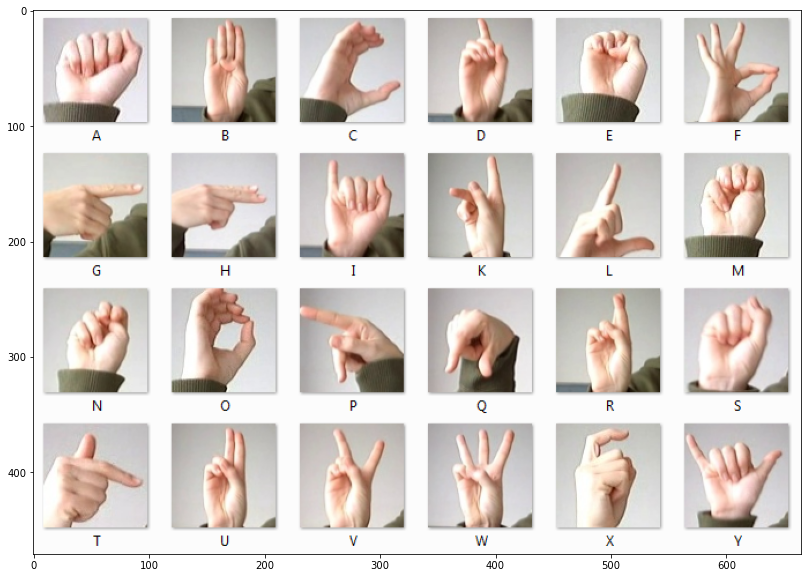

In [3]:
fig = plt.figure(figsize=(20,10))
image = imageio.imread("amer_sign2.png")
plt.imshow(image)

In [4]:
df = pd.read_csv("sign_mnist_train.csv")
print(df.shape)


(27455, 785)


In [5]:
df.describe()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
count,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,...,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000
mean,12.318813,145.419377,148.500273,151.247714,153.546531,156.210891,158.411255,160.472154,162.339683,163.954799,...,141.104863,147.495611,153.325806,159.125332,161.969259,162.736696,162.906137,161.966454,161.137898,159.824731
std,7.287552,41.358555,39.942152,39.056286,38.595247,37.111165,36.125579,35.016392,33.661998,32.651607,...,63.751194,65.512894,64.427412,63.708507,63.738316,63.444008,63.509210,63.298721,63.610415,64.396846
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.000000,121.000000,126.000000,130.000000,133.000000,137.000000,140.000000,142.000000,144.000000,146.000000,...,92.000000,96.000000,103.000000,112.000000,120.000000,125.000000,128.000000,128.000000,128.000000,125.500000
50%,13.000000,150.000000,153.000000,156.000000,158.000000,160.000000,162.000000,164.000000,165.000000,166.000000,...,144.000000,162.000000,172.000000,180.000000,183.000000,184.000000,184.000000,182.000000,182.000000,182.000000
75%,19.000000,174.000000,176.000000,178.000000,179.000000,181.000000,182.000000,183.000000,184.000000,185.000000,...,196.000000,202.000000,205.000000,207.000000,208.000000,207.000000,207.000000,206.000000,204.000000,204.000000
max,24.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000


### Ta chia thành data để train và nhãn

In [6]:
#picking only the first 10 labels
train = df[df['label'] < 10]
# Setting the label and the feature columns
y = train.loc[:,'label'].values
x = train.loc[:,'pixel1':].values

In [7]:
letter2encode = {'A': 0,'B': 1,'C': 2,'D': 3,'E': 4,'F': 5,'G': 6,'H': 7,'I': 8,'K': 9,'L': 10,'M': 11,
                'N': 12,'O': 13,'P': 14,'Q': 15,'R': 16,'S': 17,'T': 18,'U': 19,'V': 20,'W': 21,'X': 22, 'Y': 23}

def fix_label_gap(l):
    if(l>=9):
        return (l-1)
    else:
        return l

def encode(character):
    return letter2encode[character]

df['label'] = df['label'].apply(fix_label_gap)

[18, 7, 0, 12, 9, 17]


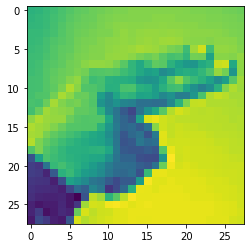

In [8]:
WORD = 'THANKS'

word = np.array(list(WORD))
embedded_word = list(map(encode, word))
print(embedded_word)

reduced_df = df[df['label'].isin(embedded_word)]

reduced_df.shape
x = reduced_df.loc[:, reduced_df.columns != 'label'].values

len(x)
y = reduced_df['label'].values

plt.imshow(x[12].reshape(28,28))

In [9]:
def plot_2d(component1, component2):
    
    fig = go.Figure(data=go.Scatter(
        x = component1,
        y = component2,
        mode='markers',
        marker=dict(
            size=20,
            color=y, #set color equal to a variable
            colorscale='Rainbow', # one of plotly colorscales
            showscale=True,
            line_width=1
        )
    ))
    fig.update_layout(margin=dict( l=100,r=100,b=100,t=100),width=2000,height=1200)                 
    fig.layout.template = 'plotly_dark'
    
    fig.show()

In [10]:
def plot_3d(component1,component2,component3):
    fig = go.Figure(data=[go.Scatter3d(
            x=component1,
            y=component2,
            z=component3,
            mode='markers',
            marker=dict(
                size=10,
                color=y,                # set color to an array/list of desired values
                colorscale='Rainbow',   # choose a colorscale
                opacity=1,
                line_width=1
            )
        )])
# tight layout
    fig.update_layout(margin=dict(l=50,r=50,b=50,t=50),width=1800,height=1000)
    fig.layout.template = 'plotly_dark'
    
    fig.show()

In [11]:
from sklearn.preprocessing import StandardScaler
## Standardizing the data
x = StandardScaler().fit_transform(x)

In [34]:
import time

start = time.time()
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(x)
print('Duration: {} seconds'.format(time.time() - start))
principal = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2','principal component 3'])


Duration: 0.1309976577758789 seconds


In [13]:
plot_2d(principalComponents[:, 0],principalComponents[:, 1])

In [14]:
plot_3d(principalComponents[:, 0],principalComponents[:, 1],principalComponents[:, 2])

In [31]:
start = time.time()
pca_50 = PCA(n_components=50)
pca_result_50 = pca_50.fit_transform(x)
tsne = TSNE(random_state = 42, n_components=3,verbose=0, perplexity=40, n_iter=400).fit_transform(pca_result_50)
print('Duration: {} seconds'.format(time.time() - start))

Duration: 29.12394142150879 seconds


In [16]:
plot_2d(tsne[:, 0],tsne[:, 1])

In [17]:
plot_3d(tsne[:, 0],tsne[:, 1],tsne[:, 2])

In [36]:
#### start = time.time()
reducer = umap.UMAP(random_state=42,n_components=3)
embedding = reducer.fit_transform(x)
print('Duration: {} seconds'.format(time.time() - start))

C:\Users\Tran Tan Phong\anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:245: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



Duration: 39.56060194969177 seconds


In [19]:
plot_2d(reducer.embedding_[:, 0],reducer.embedding_[:, 1])

In [20]:
plot_3d(reducer.embedding_[:, 0],reducer.embedding_[:, 1],reducer.embedding_[:, 2])

In [38]:
start = time.time()
X_LDA = LDA(n_components=3).fit_transform(x,y)
print('Duration: {} seconds'.format(time.time() - start))

Duration: 0.9038078784942627 seconds


In [22]:
plot_2d(X_LDA[:, 0],X_LDA[:, 1])

In [23]:
plot_3d(X_LDA[:, 0],X_LDA[:, 1],X_LDA[:, 2])

In [24]:
X_PCA = PCA(n_components=5).fit_transform(x)
X_LDA = LDA(n_components=5).fit_transform(x,y)
X_TSNE = TSNE().fit_transform(x)
X_UMAP = umap.UMAP(n_neighbors=15,
                      min_dist=0.1,
                      metric='correlation').fit_transform(x)

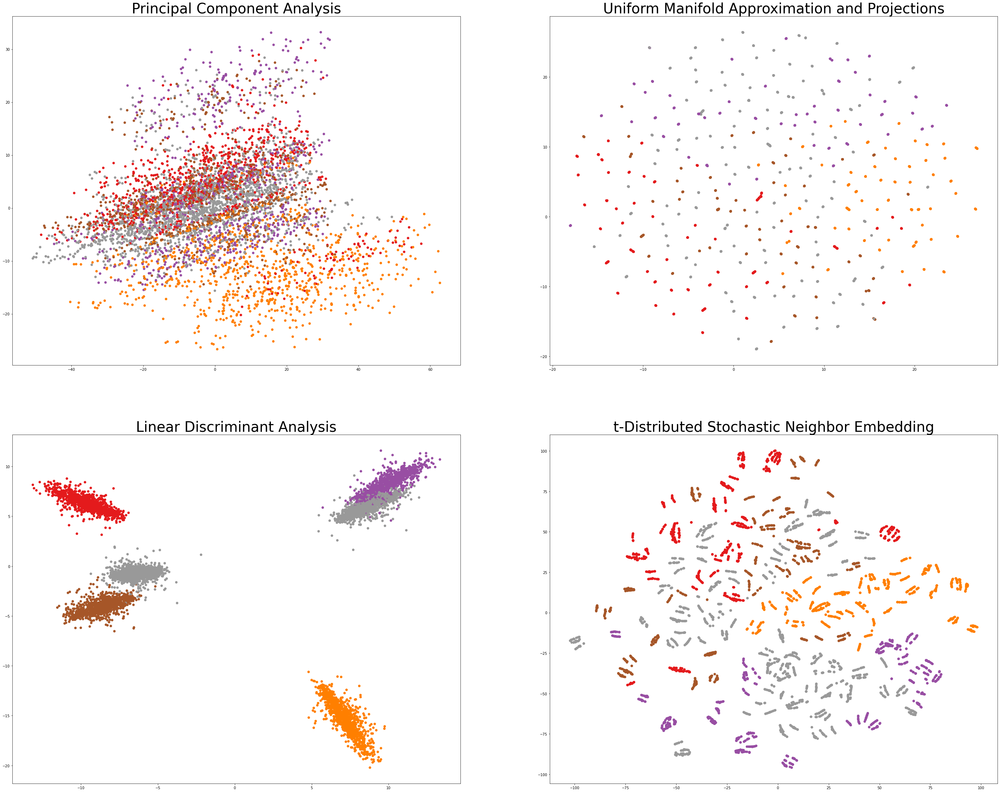

In [25]:
fig = plt.figure(figsize=(50,40))
plt.subplot(2,2,1)
plt.scatter(X_PCA[:,0], X_PCA[:,1], c=y, cmap='Set1')
plt.title("Principal Component Analysis", fontsize=40)
plt.subplot(2,2,2)
plt.scatter(X_UMAP[:,0], X_UMAP[:,1], c=y, cmap='Set1')
plt.title("Uniform Manifold Approximation and Projections", fontsize=40)
plt.subplot(2,2,3)
plt.scatter(X_LDA[:,0], X_LDA[:,1], c=y, cmap='Set1')
plt.title("Linear Discriminant Analysis", fontsize=40)
plt.subplot(2,2,4)
plt.scatter(X_TSNE[:,0], X_TSNE[:,1], c=y, cmap='Set1')
plt.title("t-Distributed Stochastic Neighbor Embedding", fontsize=40)
plt.show()

### PCA thực hiện việc phân loại các thuộc tính không tốt. Như vậy, ta có thể thấy PCA có nhược điểm là bị ảnh hưởng nhiều bở những điểm ngoại lai của dữ liệu. PCA là một phép chiếu tuyến tính, mục tiêu là tìm ra nhưng thành phần chính tối ưu cho bộ dữ liệu.

### t-SNE thực hiện tốt hơn nếu như so sánh với PCA khi ta thấy được sự tách biệt các nhóm. Các nhãn giống nhau được gom nhóm lại với nhau. Tuy nhiên thuật toán không tốt như ta mong đợi

### UMAP cho lại kết quả vượt trội khi so với t-SNE và PCA. Từ kết quả được trực quan hóa bằng mô hình 2D và 3D, ta có thể thấy những nhóm nhỏ được phân biệt tốt. UMAP nhanh hơn t-SNE khá nhiều, tuy nhiên thời gian tính toán vẫn khá lớn khi so với PCA

### Cuối cùng, ta thấy LDA vượt trội các kỹ thuật còn lại về mọi mặt. Thời gian tính toán của LDA cũng rất nhanh (chỉ sau PCA) cũng như chúng minh các cụm được phân tách rõ ràng như ta mong đợi

### Lý do mà LDA có kết quả tốt là vì không giống như LDA, các thuật toán khác thực hiện mà không cần biết nhãn, là thuật toán học không giám sát. 

In [26]:
# import plotly.express as px

# fig = px.scatter(x=X_LDA[:, 0], y=X_LDA[:, 1])
# fig = plot_2d(X_LDA[:, 0],X_LDA[:, 1])
# fig.write_html("file.html")

AttributeError: 'NoneType' object has no attribute 'write_html'

In [ ]:
# !pip install dash

In [ ]:
# # Run this app with `python app.py` and
# # visit http://127.0.0.1:8050/ in your web browser.

# from dash import Dash, html, dcc
# import plotly.express as px
# import pandas as pd

# app = Dash(__name__)

# # assume you have a "long-form" data frame
# # see https://plotly.com/python/px-arguments/ for more options
# df = pd.DataFrame({
#     "Fruit": ["Apples", "Oranges", "Bananas", "Apples", "Oranges", "Bananas"],
#     "Amount": [4, 1, 2, 2, 4, 5],
#     "City": ["SF", "SF", "SF", "Montreal", "Montreal", "Montreal"]
# })

# fig = px.bar(df, x="Fruit", y="Amount", color="City", barmode="group")

# app.layout = html.Div(children=[
#     html.H1(children='Hello Dash'),

#     html.Div(children='''
#         Dash: A web application framework for your data.
#     '''),

#     dcc.Graph(
#         id='example-graph',
#         figure=fig
#     )
# ])

# if __name__ == '__main__':
#     app.run_server(debug=True)
